In [1]:
import pathlib

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

In [2]:
dataset_path = '/home/amanda/Dropbox/trabalho/testes/aplicacoes/california_housing/housing.csv'
raw_dataset = pd.read_csv(dataset_path)
dataset = raw_dataset.copy()
dataset.tail()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
20635,-121.09,39.48,25.0,1665.0,374.0,845.0,330.0,1.5603,78100.0,INLAND
20636,-121.21,39.49,18.0,697.0,150.0,356.0,114.0,2.5568,77100.0,INLAND
20637,-121.22,39.43,17.0,2254.0,485.0,1007.0,433.0,1.7000,92300.0,INLAND
20638,-121.32,39.43,18.0,1860.0,409.0,741.0,349.0,1.8672,84700.0,INLAND
20639,-121.24,39.37,16.0,2785.0,616.0,1387.0,530.0,2.3886,89400.0,INLAND


In [3]:
len(dataset)

20640

In [4]:
dataset.pop('ocean_proximity')

0        NEAR BAY
1        NEAR BAY
2        NEAR BAY
3        NEAR BAY
4        NEAR BAY
           ...   
20635      INLAND
20636      INLAND
20637      INLAND
20638      INLAND
20639      INLAND
Name: ocean_proximity, Length: 20640, dtype: object

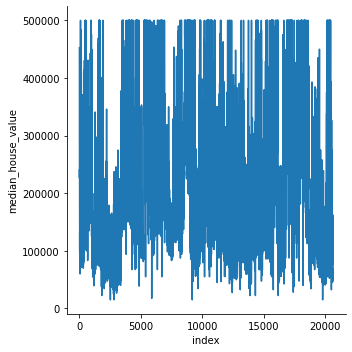

In [5]:
sns.relplot(x='index', y='median_house_value', kind='line', data=dataset.reset_index())

In [6]:
dataset.tail()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
20635,-121.09,39.48,25.0,1665.0,374.0,845.0,330.0,1.5603,78100.0
20636,-121.21,39.49,18.0,697.0,150.0,356.0,114.0,2.5568,77100.0
20637,-121.22,39.43,17.0,2254.0,485.0,1007.0,433.0,1.7000,92300.0
20638,-121.32,39.43,18.0,1860.0,409.0,741.0,349.0,1.8672,84700.0
20639,-121.24,39.37,16.0,2785.0,616.0,1387.0,530.0,2.3886,89400.0


In [7]:
train_dataset = dataset[:10320]
test_dataset = dataset[10320:]

In [8]:
len(train_dataset)

10320

In [9]:
len(test_dataset)

10320

In [10]:
train_dataset.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0


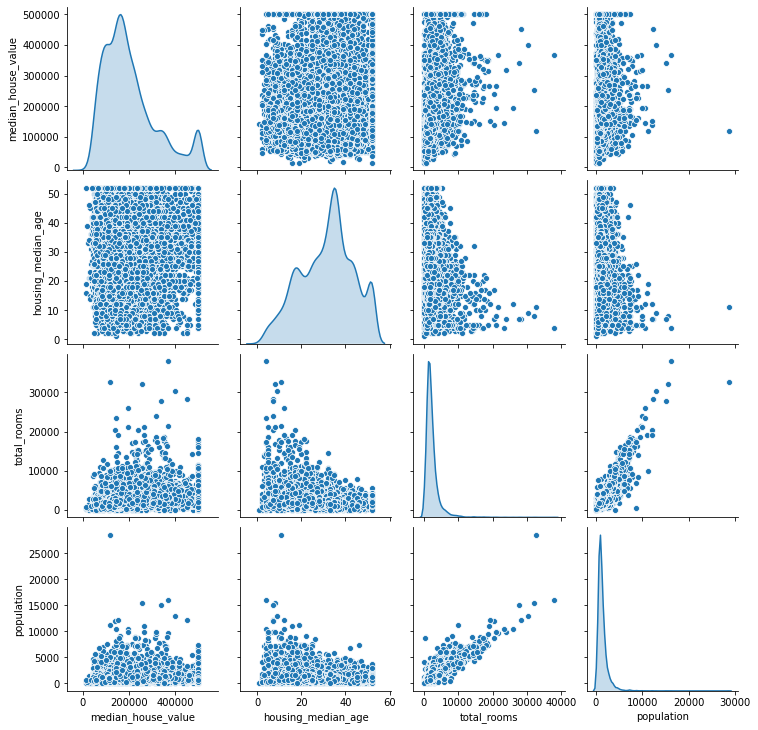

In [12]:
sns.pairplot(train_dataset[["median_house_value", "housing_median_age", "total_rooms", "population"]], diag_kind="kde")

In [45]:
train_stats = train_dataset.describe()
train_stats = train_stats.transpose()
train_stats

,count,mean,std,min,25%,50%,75%,max
symboling,80.0,0.837500,0.986539,-1.00,0.00,1.00,1.00,3.00
normalized-losses,80.0,129.900000,31.433917,78.00,106.00,125.00,153.00,231.00
wheel-base,80.0,97.445000,5.544113,86.60,93.70,96.30,99.50,115.60
length,80.0,170.157500,12.620816,141.10,159.10,171.55,177.05,202.60
width,80.0,65.516250,2.240448,60.30,63.80,64.80,66.50,71.70
height,80.0,53.420000,2.264386,49.40,51.45,54.10,54.50,59.80
curb-weight,80.0,2404.950000,559.082293,1488.00,1954.75,2314.00,2723.75,4066.00
engine-size,80.0,120.087500,36.897461,61.00,92.00,110.00,124.25,258.00
bore,80.0,3.217625,0.222541,2.91,3.03,3.15,3.39,3.76
stroke,80.0,3.335125,0.241792,2.19,3.23,3.34,3.46,4.17


In [46]:
def scale(x):
  return (x - train_stats['min']) / (train_stats['max'] - train_stats['min'])
scaled_train_data = scale(train_dataset)
scaled_test_data = scale(test_dataset)

In [47]:
scaled_train_data.tail()

,symboling,normalized-losses,wheel-base,length,width,height,curb-weight,engine-size,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
105,1.00,0.758170,0.162069,0.481301,0.666667,0.028846,0.640419,0.609137,0.611765,0.545455,0.053691,1.000000,0.567568,0.058824,0.138889,0.486474
106,0.50,1.000000,0.434483,0.608130,0.666667,0.028846,0.640419,0.609137,0.611765,0.545455,0.134228,0.736842,0.567568,0.117647,0.194444,0.443003
107,0.25,0.542484,0.734483,0.741463,0.710526,0.701923,0.594259,0.299492,0.647059,0.505051,0.093960,0.322368,0.459459,0.117647,0.166667,0.225681
108,0.25,0.542484,0.734483,0.741463,0.710526,0.701923,0.662917,0.461929,0.929412,0.671717,0.939597,0.309211,0.000000,0.382353,0.416667,0.269152
111,0.25,0.542484,0.734483,0.741463,0.710526,0.701923,0.615593,0.299492,0.647059,0.000000,0.093960,0.309211,0.459459,0.117647,0.166667,0.348738


In [48]:
train_labels = scaled_train_data.pop('price')
test_labels = scaled_test_data.pop('price')

In [49]:
path = '/home/amanda/Dropbox/trabalho/testes/aplicacoes/autos/data/'
np.savetxt(path + 'X_train.csv', scaled_train_data)
np.savetxt(path + 'X_test.csv', scaled_test_data)
np.savetxt(path + 'Y_train.csv', train_labels)
np.savetxt(path + 'Y_test.csv', test_labels)